# Load the dataset

In [1]:
import pandas as pd

# Load the dataset
df_matches = pd.read_csv('/content/matches.csv', index_col=0)

# Display the first few rows
df_matches.head()

,date,time,comp,round,day,venue,result,gf,ga,opponent,...,match report,notes,sh,sot,dist,fk,pk,pkatt,season,team
1,2021-08-15,16:30,Premier League,Matchweek 1,Sun,Away,L,0.0,1.0,Tottenham,...,Match Report,NaN,18.0,4.0,16.9,1.0,0.0,0.0,2022,Manchester City
2,2021-08-21,15:00,Premier League,Matchweek 2,Sat,Home,W,5.0,0.0,Norwich City,...,Match Report,NaN,16.0,4.0,17.3,1.0,0.0,0.0,2022,Manchester City
3,2021-08-28,12:30,Premier League,Matchweek 3,Sat,Home,W,5.0,0.0,Arsenal,...,Match Report,NaN,25.0,10.0,14.3,0.0,0.0,0.0,2022,Manchester City
4,2021-09-11,15:00,Premier League,Matchweek 4,Sat,Away,W,1.0,0.0,Leicester City,...,Match Report,NaN,25.0,8.0,14.0,0.0,0.0,0.0,2022,Manchester City
6,2021-09-18,15:00,Premier League,Matchweek 5,Sat,Home,D,0.0,0.0,Southampton,...,Match Report,NaN,16.0,1.0,15.7,1.0,0.0,0.0,2022,Manchester City


In [3]:
df_matches.shape

(1389, 27)

#Exploratory Data Analysis

EDA will help us understand the data and uncover insights, trends, and potential anomalies.

###Summary Statistics & Missing Values

In [4]:
# Summary statistics
df_summary = df_matches.describe()

# Check for missing values
df_missing = df_matches.isnull().sum()

df_summary, df_missing

(                gf           ga           xg          xga         poss  \
 count  1389.000000  1389.000000  1389.000000  1389.000000  1389.000000   
 mean      1.335493     1.380850     1.304176     1.338445    49.702664   
 std       1.274235     1.291049     0.767268     0.789360    12.401897   
 min       0.000000     0.000000     0.000000     0.000000    18.000000   
 25%       0.000000     0.000000     0.700000     0.700000    40.000000   
 50%       1.000000     1.000000     1.200000     1.200000    50.000000   
 75%       2.000000     2.000000     1.800000     1.800000    59.000000   
 max       9.000000     9.000000     4.600000     5.000000    82.000000   
 
          attendance  notes           sh          sot         dist  \
 count    693.000000    0.0  1389.000000  1389.000000  1388.000000   
 mean   36089.963925    NaN    12.153348     4.041037    17.011527   
 std    17797.991778    NaN     5.268876     2.403866     2.988364   
 min     2000.000000    NaN     0.000000   

In [5]:
# Check data types of each column
data_types = df_matches.dtypes
data_types

date             object
time             object
comp             object
round            object
day              object
venue            object
result           object
gf              float64
ga              float64
opponent         object
xg              float64
xga             float64
poss            float64
attendance      float64
captain          object
formation        object
referee          object
match report     object
notes           float64
sh              float64
sot             float64
dist            float64
fk              float64
pk              float64
pkatt           float64
season            int64
team             object
dtype: object

In [6]:
# Check unique teams involved
unique_teams = df_matches['team'].unique()
unique_teams

array(['Manchester City', 'Chelsea', 'Arsenal', 'Tottenham Hotspur',
       'Manchester United', 'West Ham United', 'Wolverhampton Wanderers',
       'Newcastle United', 'Leicester City', 'Brighton and Hove Albion',
       'Brentford', 'Southampton', 'Crystal Palace', 'Aston Villa',
       'Leeds United', 'Burnley', 'Everton', 'Watford', 'Norwich City',
       'Liverpool', 'Fulham', 'West Bromwich Albion', 'Sheffield United'],
      dtype=object)

- We have data for 23 teams

In [7]:
# Check unique rounds in the dataset
unique_rounds = df_matches['round'].unique()
unique_rounds

array(['Matchweek 1', 'Matchweek 2', 'Matchweek 3', 'Matchweek 4',
       'Matchweek 5', 'Matchweek 6', 'Matchweek 7', 'Matchweek 8',
       'Matchweek 9', 'Matchweek 10', 'Matchweek 11', 'Matchweek 12',
       'Matchweek 13', 'Matchweek 14', 'Matchweek 15', 'Matchweek 16',
       'Matchweek 17', 'Matchweek 18', 'Matchweek 19', 'Matchweek 20',
       'Matchweek 21', 'Matchweek 22', 'Matchweek 23', 'Matchweek 24',
       'Matchweek 25', 'Matchweek 26', 'Matchweek 27', 'Matchweek 28',
       'Matchweek 29', 'Matchweek 31', 'Matchweek 32', 'Matchweek 30',
       'Matchweek 34', 'Matchweek 33', 'Matchweek 35', 'Matchweek 36',
       'Matchweek 37', 'Matchweek 38'], dtype=object)

###Visualizations

Distribution of goals scored per match

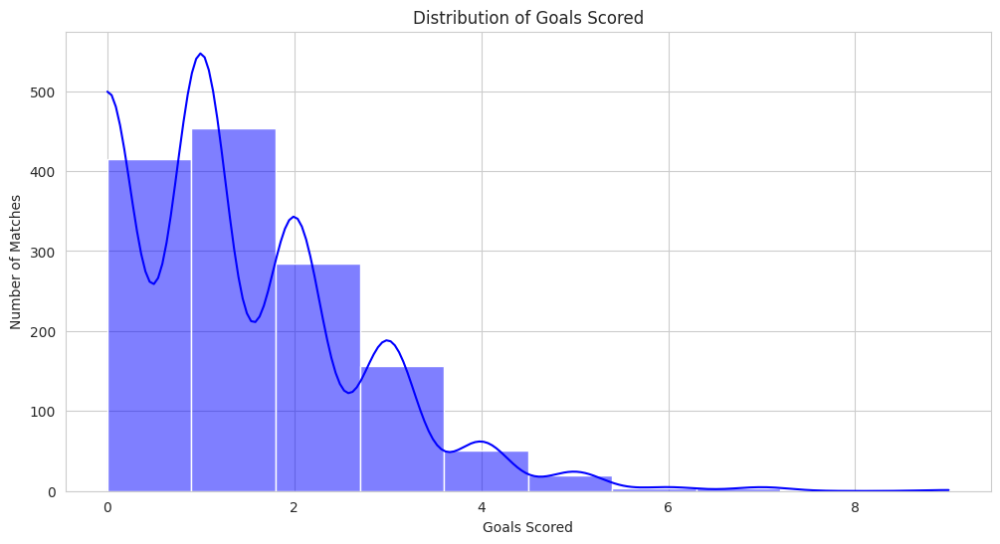

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting up visualization style
sns.set_style("whitegrid")

# Plotting distribution of goals scored by teams
plt.figure(figsize=(12, 6))
sns.histplot(df_matches['gf'], bins=10, kde=True, color='blue')
plt.title('Distribution of Goals Scored')
plt.xlabel('Goals Scored')
plt.ylabel('Number of Matches')
plt.show()

Wins per team

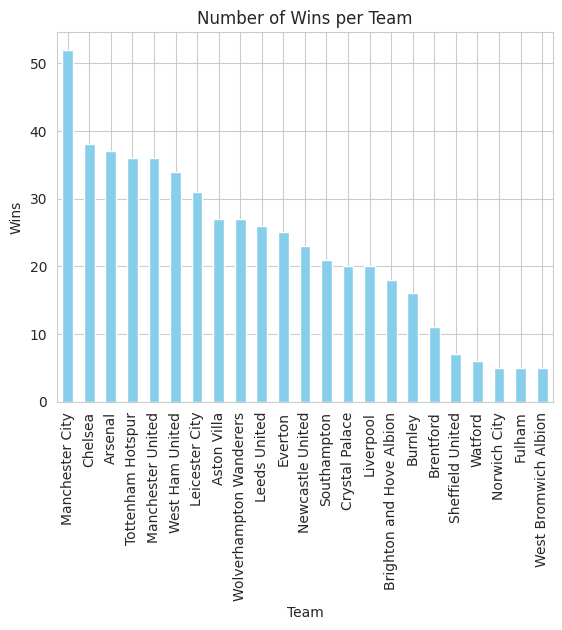

In [9]:
team_wins = df_matches[df_matches['result'] == 'W']['team'].value_counts()

# Plot
team_wins.plot(kind='bar', color='skyblue')
plt.title('Number of Wins per Team')
plt.xlabel('Team')
plt.ylabel('Wins')
plt.xticks(rotation=90)
plt.show()

Frequency of home vs. away wins

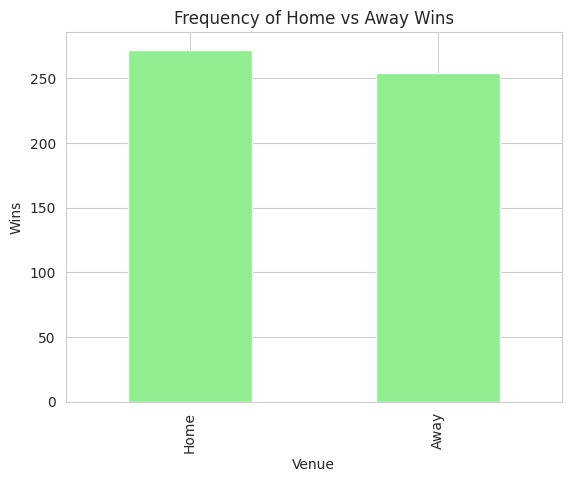

In [10]:
home_away_wins = df_matches[df_matches['result'] == 'W']['venue'].value_counts()

# Plot
home_away_wins.plot(kind='bar', color='lightgreen')
plt.title('Frequency of Home vs Away Wins')
plt.xlabel('Venue')
plt.ylabel('Wins')
plt.show()

In [ ]:
!pip install pandas_profiling

In [48]:
import pandas_profiling

# Generate the report
profile = pandas_profiling.ProfileReport(df_matches)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

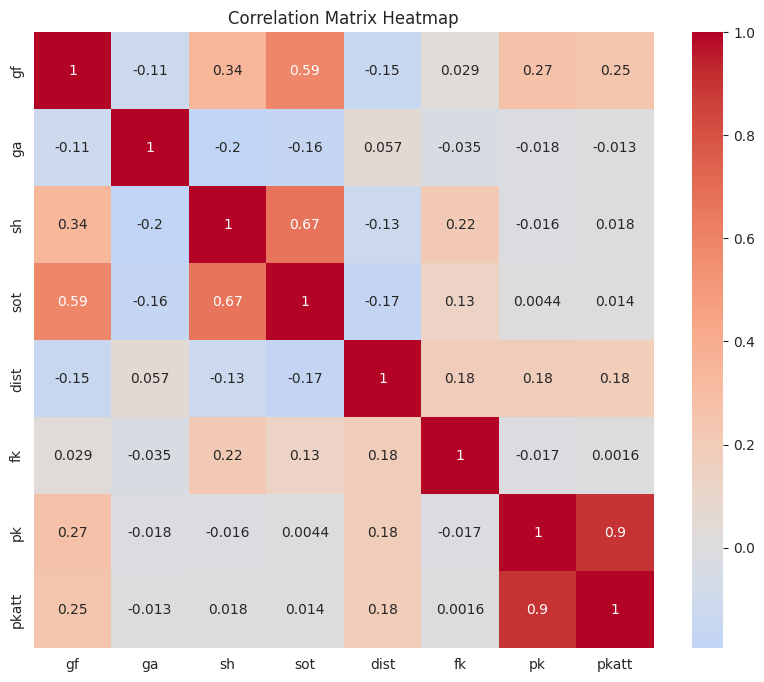

In [50]:
numerical_columns = ['gf', 'ga', 'sh', 'sot', 'dist', 'fk', 'pk', 'pkatt']
correlation_matrix = df_matches[numerical_columns].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix Heatmap')
plt.show()

#Data Preprocessing

In [11]:
df_matches["team"].value_counts()

Southampton                 72
Brighton and Hove Albion    72
Manchester United           72
West Ham United             72
Newcastle United            72
Burnley                     71
Leeds United                71
Crystal Palace              71
Manchester City             71
Wolverhampton Wanderers     71
Tottenham Hotspur           71
Arsenal                     71
Leicester City              70
Chelsea                     70
Aston Villa                 70
Everton                     70
Liverpool                   38
Fulham                      38
West Bromwich Albion        38
Sheffield United            38
Brentford                   34
Watford                     33
Norwich City                33
Name: team, dtype: int64

In [12]:
df_matches[df_matches['team'] == 'Liverpool'].sort_values(by='date')

,date,time,comp,round,day,venue,result,gf,ga,opponent,...,match report,notes,sh,sot,dist,fk,pk,pkatt,season,team
1,2020-09-12,17:30,Premier League,Matchweek 1,Sat,Home,W,4.0,3.0,Leeds United,...,Match Report,NaN,20.0,4.0,17.0,0.0,2.0,2.0,2021,Liverpool
2,2020-09-20,16:30,Premier League,Matchweek 2,Sun,Away,W,2.0,0.0,Chelsea,...,Match Report,NaN,17.0,5.0,17.7,1.0,0.0,0.0,2021,Liverpool
4,2020-09-28,20:00,Premier League,Matchweek 3,Mon,Home,W,3.0,1.0,Arsenal,...,Match Report,NaN,21.0,9.0,16.8,0.0,0.0,0.0,2021,Liverpool
6,2020-10-04,19:15,Premier League,Matchweek 4,Sun,Away,L,2.0,7.0,Aston Villa,...,Match Report,NaN,14.0,8.0,15.8,1.0,0.0,0.0,2021,Liverpool
7,2020-10-17,12:30,Premier League,Matchweek 5,Sat,Away,D,2.0,2.0,Everton,...,Match Report,NaN,22.0,8.0,15.0,1.0,0.0,0.0,2021,Liverpool
9,2020-10-24,20:00,Premier League,Matchweek 6,Sat,Home,W,2.0,1.0,Sheffield Utd,...,Match Report,NaN,17.0,5.0,18.2,1.0,0.0,0.0,2021,Liverpool
11,2020-10-31,17:30,Premier League,Matchweek 7,Sat,Home,W,2.0,1.0,West Ham,...,Match Report,NaN,8.0,2.0,18.6,1.0,1.0,1.0,2021,Liverpool
13,2020-11-08,16:30,Premier League,Matchweek 8,Sun,Away,D,1.0,1.0,Manchester City,...,Match Report,NaN,9.0,2.0,21.5,0.0,1.0,1.0,2021,Liverpool
14,2020-11-22,19:15,Premier League,Matchweek 9,Sun,Home,W,3.0,0.0,Leicester City,...,Match Report,NaN,24.0,12.0,11.9,0.0,0.0,0.0,2021,Liverpool
16,2020-11-28,12:30,Premier League,Matchweek 10,Sat,Away,D,1.0,1.0,Brighton,...,Match Report,NaN,6.0,2.0,20.9,0.0,0.0,0.0,2021,Liverpool


- Liverpool played 52 matches in the 2021 season

In [13]:
del df_matches['comp']

In [14]:
del df_matches['notes']

In [15]:
df_matches["date"] = pd.to_datetime(df_matches["date"])

In [16]:
df_matches["target"] = (df_matches["result"] == "W").astype("int")

In [17]:
df_matches.head()

,date,time,round,day,venue,result,gf,ga,opponent,xg,...,match report,sh,sot,dist,fk,pk,pkatt,season,team,target
1,2021-08-15,16:30,Matchweek 1,Sun,Away,L,0.0,1.0,Tottenham,1.9,...,Match Report,18.0,4.0,16.9,1.0,0.0,0.0,2022,Manchester City,0
2,2021-08-21,15:00,Matchweek 2,Sat,Home,W,5.0,0.0,Norwich City,2.7,...,Match Report,16.0,4.0,17.3,1.0,0.0,0.0,2022,Manchester City,1
3,2021-08-28,12:30,Matchweek 3,Sat,Home,W,5.0,0.0,Arsenal,3.8,...,Match Report,25.0,10.0,14.3,0.0,0.0,0.0,2022,Manchester City,1
4,2021-09-11,15:00,Matchweek 4,Sat,Away,W,1.0,0.0,Leicester City,2.9,...,Match Report,25.0,8.0,14.0,0.0,0.0,0.0,2022,Manchester City,1
6,2021-09-18,15:00,Matchweek 5,Sat,Home,D,0.0,0.0,Southampton,1.1,...,Match Report,16.0,1.0,15.7,1.0,0.0,0.0,2022,Manchester City,0


In [18]:
df_matches["venue_code"] = df_matches["venue"].astype("category").cat.codes

In [19]:
df_matches["opp_code"] = df_matches["opponent"].astype("category").cat.codes

In [20]:
df_matches["hour"] = df_matches["time"].str.replace(":.+", "", regex=True).astype("int")

df_matches["day_code"] = df_matches["date"].dt.dayofweek

df_matches

,date,time,round,day,venue,result,gf,ga,opponent,xg,...,fk,pk,pkatt,season,team,target,venue_code,opp_code,hour,day_code
1,2021-08-15,16:30,Matchweek 1,Sun,Away,L,0.0,1.0,Tottenham,1.9,...,1.0,0.0,0.0,2022,Manchester City,0,0,18,16,6
2,2021-08-21,15:00,Matchweek 2,Sat,Home,W,5.0,0.0,Norwich City,2.7,...,1.0,0.0,0.0,2022,Manchester City,1,1,15,15,5
3,2021-08-28,12:30,Matchweek 3,Sat,Home,W,5.0,0.0,Arsenal,3.8,...,0.0,0.0,0.0,2022,Manchester City,1,1,0,12,5
4,2021-09-11,15:00,Matchweek 4,Sat,Away,W,1.0,0.0,Leicester City,2.9,...,0.0,0.0,0.0,2022,Manchester City,1,0,10,15,5
6,2021-09-18,15:00,Matchweek 5,Sat,Home,D,0.0,0.0,Southampton,1.1,...,1.0,0.0,0.0,2022,Manchester City,0,1,17,15,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38,2021-05-02,19:15,Matchweek 34,Sun,Away,L,0.0,4.0,Tottenham,0.5,...,0.0,0.0,0.0,2021,Sheffield United,0,0,18,19,6
39,2021-05-08,15:00,Matchweek 35,Sat,Home,L,0.0,2.0,Crystal Palace,0.7,...,1.0,0.0,0.0,2021,Sheffield United,0,1,6,15,5
40,2021-05-16,19:00,Matchweek 36,Sun,Away,W,1.0,0.0,Everton,1.6,...,0.0,0.0,0.0,2021,Sheffield United,1,0,7,19,6
41,2021-05-19,18:00,Matchweek 37,Wed,Away,L,0.0,1.0,Newcastle Utd,0.8,...,1.0,0.0,0.0,2021,Sheffield United,0,0,14,18,2


In [21]:
# Distribution of match rounds for each season
match_rounds_per_season = df_matches.groupby('season')['round'].value_counts().unstack()
match_rounds_per_season

round,Matchweek 1,Matchweek 10,Matchweek 11,Matchweek 12,Matchweek 13,Matchweek 14,Matchweek 15,Matchweek 16,Matchweek 17,Matchweek 18,...,Matchweek 35,Matchweek 36,Matchweek 37,Matchweek 38,Matchweek 4,Matchweek 5,Matchweek 6,Matchweek 7,Matchweek 8,Matchweek 9
season,,,,,,,,,,,,,,,,,,,,,
2021,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,...,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0
2022,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,17.0,...,NaN,NaN,NaN,NaN,19.0,19.0,19.0,19.0,19.0,19.0


- For the 2021 season, there are 20 matches for each match week, which is consistent with a typical Premier League season where each of the 20 teams plays once per match week.

- For the 2022 season, the match weeks mostly have 19 matches. Additionally, data for the last few match weeks (from Matchweek 35 to Matchweek 38) is missing. This could imply that the dataset does not include all the matches for the 2022 season.

Given the missing matches in the 2022 season, we'll acknowledge this and use the available data for our analyses

#Model Building

In [22]:
from sklearn.ensemble import RandomForestClassifier

In [23]:
rf = RandomForestClassifier(n_estimators=50, min_samples_split=10, random_state=1)

In [24]:
train = df_matches[df_matches["date"] < '2022-01-01']
test = df_matches[df_matches["date"] > '2022-01-01']

In [25]:
predictors = ["venue_code", "opp_code", "hour", "day_code"]

In [26]:
rf.fit(train[predictors], train["target"])

RandomForestClassifier(min_samples_split=10, n_estimators=50, random_state=1)

In [27]:
preds = rf.predict(test[predictors])

In [28]:
from sklearn.metrics import accuracy_score

error = accuracy_score(test["target"], preds)
error

0.6123188405797102

In [29]:
combined = pd.DataFrame(dict(actual=test["target"], predicted=preds))

In [30]:
pd.crosstab(index=combined["actual"], columns=combined["predicted"])

predicted,0,1
actual,,
0,141,31
1,76,28


In [31]:
from sklearn.metrics import precision_score

precision_score(test["target"], preds)

0.4745762711864407

In [32]:
group_matches = df_matches.groupby("team")

group = group_matches.get_group("Manchester City").sort_values("date")

In [33]:
def rolling_averages(group, cols, new_cols):
    group = group.sort_values("date")
    rolling_stats = group[cols].rolling(3, closed='left').mean()
    group[new_cols] = rolling_stats
    group = group.dropna(subset=new_cols)
    return group

In [34]:
cols = ["gf", "ga", "sh", "sot", "dist", "fk", "pk", "pkatt"]
new_cols = [f"{c}_rolling" for c in cols]

rolling_averages(group, cols, new_cols)

,date,time,round,day,venue,result,gf,ga,opponent,xg,...,hour,day_code,gf_rolling,ga_rolling,sh_rolling,sot_rolling,dist_rolling,fk_rolling,pk_rolling,pkatt_rolling
5,2020-10-17,17:30,Matchweek 5,Sat,Home,W,1.0,0.0,Arsenal,1.5,...,17,5,2.000000,2.333333,17.333333,4.666667,18.900000,1.333333,0.333333,0.333333
7,2020-10-24,12:30,Matchweek 6,Sat,Away,D,1.0,1.0,West Ham,1.1,...,12,5,1.333333,2.000000,17.333333,3.666667,17.733333,0.666667,0.000000,0.000000
9,2020-10-31,12:30,Matchweek 7,Sat,Away,W,1.0,0.0,Sheffield Utd,1.5,...,12,5,1.000000,0.666667,16.666667,4.333333,18.233333,0.666667,0.000000,0.000000
11,2020-11-08,16:30,Matchweek 8,Sun,Home,D,1.0,1.0,Liverpool,1.6,...,16,6,1.000000,0.333333,14.333333,6.666667,18.466667,1.000000,0.000000,0.000000
12,2020-11-21,17:30,Matchweek 9,Sat,Away,L,0.0,2.0,Tottenham,1.3,...,17,5,1.000000,0.666667,12.000000,5.666667,19.366667,1.000000,0.000000,0.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42,2022-03-14,20:00,Matchweek 29,Mon,Away,D,0.0,0.0,Crystal Palace,2.3,...,20,0,2.333333,1.333333,19.000000,7.000000,15.366667,0.333333,0.333333,0.333333
44,2022-04-02,15:00,Matchweek 31,Sat,Away,W,2.0,0.0,Burnley,1.8,...,15,5,1.666667,0.333333,18.333333,7.333333,16.000000,0.333333,0.000000,0.000000
46,2022-04-10,16:30,Matchweek 32,Sun,Home,D,2.0,2.0,Liverpool,2.0,...,16,6,2.000000,0.333333,20.000000,6.666667,16.133333,0.333333,0.000000,0.000000
49,2022-04-20,20:00,Matchweek 30,Wed,Home,W,3.0,0.0,Brighton,1.2,...,20,2,1.333333,0.666667,15.666667,4.666667,16.700000,0.333333,0.000000,0.000000


In [35]:
matches_rolling = df_matches.groupby("team").apply(lambda x: rolling_averages(x, cols, new_cols))
matches_rolling

date   time         round  day venue result  \
team                                                                           
Arsenal                 6  2020-10-04  14:00   Matchweek 4  Sun  Home      W   
                        7  2020-10-17  17:30   Matchweek 5  Sat  Away      L   
                        9  2020-10-25  19:15   Matchweek 6  Sun  Home      L   
                        11 2020-11-01  16:30   Matchweek 7  Sun  Away      W   
                        13 2020-11-08  19:15   Matchweek 8  Sun  Home      L   
...                               ...    ...           ...  ...   ...    ...   
Wolverhampton Wanderers 32 2022-03-13  14:00  Matchweek 29  Sun  Away      W   
                        33 2022-03-18  20:00  Matchweek 30  Fri  Home      L   
                        34 2022-04-02  15:00  Matchweek 31  Sat  Home      W   
                        35 2022-04-08  20:00  Matchweek 32  Fri  Away      L   
                        36 2022-04-24  14:00  Matchweek 34  Sun  Away      L   

                             gf   ga         opponent   xg  ...  hour  \
team                                                        ...         
Arsenal                 6   2.0  1.0    Sheffield Utd  0.4  ...    14   
                        7   0.0  1.0  Manchester City  0.9  ...    17   
                        9   0.0  1.0   Leicester City  0.9  ...    19   
                        11  1.0  0.0   Manchester Utd  1.1  ...    16   
                        13  0.0  3.0      Aston Villa  1.5  ...    19   
...                         ...  ...              ...  ...  ...   ...   
Wolverhampton Wanderers 32  1.0  0.0          Everton  0.8  ...    14   
                        33  2.0  3.0     Leeds United  0.8  ...    20   
                        34  2.0  1.0      Aston Villa  1.2  ...    15   
                        35  0.0  1.0    Newcastle Utd  0.3  ...    20   
                        36  0.0  1.0          Burnley  0.7  ...    14   

                            day_code  gf_rolling ga_rolling sh_rolling  \
team                                                                     
Arsenal                 6          6    2.000000   1.333333   7.666667   
                        7          5    1.666667   1.666667   5.333333   
                        9          6    1.000000   1.666667   7.000000   
                        11         6    0.666667   1.000000   9.666667   
                        13         6    0.333333   0.666667   9.666667   
...                              ...         ...        ...        ...   
Wolverhampton Wanderers 32         6    1.333333   1.000000  12.333333   
                        33         4    1.666667   0.666667  12.333333   
                        34         5    2.333333   1.000000  13.000000   
                        35         4    1.666667   1.333333  13.000000   
                        36         6    1.333333   1.666667  10.000000   

                           sot_rolling dist_rolling  fk_rolling  pk_rolling  \
team                                                                          
Arsenal                 6     3.666667    14.733333    0.666667    0.000000   
                        7     3.666667    15.766667    0.000000    0.000000   
                        9     3.666667    16.733333    0.666667    0.000000   
                        11    4.000000    16.033333    1.000000    0.000000   
                        13    2.666667    18.033333    1.000000    0.333333   
...                                ...          ...         ...         ...   
Wolverhampton Wanderers 32    3.666667    19.300000    0.000000    0.000000   
                        33    4.333333    19.600000    0.000000    0.000000   
                        34    5.333333    19.833333    0.000000    0.000000   
                        35    5.000000    18.533333    0.000000    0.000000   
                        36    4.666667    17.633333    0.000000    0.000000   

                            pkatt_rolling  
team   

In [36]:
matches_rolling = matches_rolling.droplevel('team')
matches_rolling

,date,time,round,day,venue,result,gf,ga,opponent,xg,...,hour,day_code,gf_rolling,ga_rolling,sh_rolling,sot_rolling,dist_rolling,fk_rolling,pk_rolling,pkatt_rolling
6,2020-10-04,14:00,Matchweek 4,Sun,Home,W,2.0,1.0,Sheffield Utd,0.4,...,14,6,2.000000,1.333333,7.666667,3.666667,14.733333,0.666667,0.000000,0.000000
7,2020-10-17,17:30,Matchweek 5,Sat,Away,L,0.0,1.0,Manchester City,0.9,...,17,5,1.666667,1.666667,5.333333,3.666667,15.766667,0.000000,0.000000,0.000000
9,2020-10-25,19:15,Matchweek 6,Sun,Home,L,0.0,1.0,Leicester City,0.9,...,19,6,1.000000,1.666667,7.000000,3.666667,16.733333,0.666667,0.000000,0.000000
11,2020-11-01,16:30,Matchweek 7,Sun,Away,W,1.0,0.0,Manchester Utd,1.1,...,16,6,0.666667,1.000000,9.666667,4.000000,16.033333,1.000000,0.000000,0.000000
13,2020-11-08,19:15,Matchweek 8,Sun,Home,L,0.0,3.0,Aston Villa,1.5,...,19,6,0.333333,0.666667,9.666667,2.666667,18.033333,1.000000,0.333333,0.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32,2022-03-13,14:00,Matchweek 29,Sun,Away,W,1.0,0.0,Everton,0.8,...,14,6,1.333333,1.000000,12.333333,3.666667,19.300000,0.000000,0.000000,0.000000
33,2022-03-18,20:00,Matchweek 30,Fri,Home,L,2.0,3.0,Leeds United,0.8,...,20,4,1.666667,0.666667,12.333333,4.333333,19.600000,0.000000,0.000000,0.000000
34,2022-04-02,15:00,Matchweek 31,Sat,Home,W,2.0,1.0,Aston Villa,1.2,...,15,5,2.333333,1.000000,13.000000,5.333333,19.833333,0.000000,0.000000,0.000000
35,2022-04-08,20:00,Matchweek 32,Fri,Away,L,0.0,1.0,Newcastle Utd,0.3,...,20,4,1.666667,1.333333,13.000000,5.000000,18.533333,0.000000,0.000000,0.000000


In [37]:
matches_rolling.index = range(matches_rolling.shape[0])

In [38]:
def make_predictions(data, predictors):
    train = data[data["date"] < '2022-01-01']
    test = data[data["date"] > '2022-01-01']
    rf.fit(train[predictors], train["target"])
    preds = rf.predict(test[predictors])
    combined = pd.DataFrame(dict(actual=test["target"], predicted=preds), index=test.index)
    error = precision_score(test["target"], preds)
    return combined, error

In [39]:
combined, error = make_predictions(matches_rolling, predictors + new_cols)
error

0.625

In [40]:
combined = combined.merge(matches_rolling[["date", "team", "opponent", "result"]], left_index=True, right_index=True)
combined.head()

,actual,predicted,date,team,opponent,result
55,0,0,2022-01-23,Arsenal,Burnley,D
56,1,0,2022-02-10,Arsenal,Wolves,W
57,1,0,2022-02-19,Arsenal,Brentford,W
58,1,1,2022-02-24,Arsenal,Wolves,W
59,1,1,2022-03-06,Arsenal,Watford,W


In [41]:
class MissingDict(dict):
    __missing__ = lambda self, key: key

map_values = {"Brighton and Hove Albion": "Brighton", "Manchester United": "Manchester Utd", "Newcastle United": "Newcastle Utd", "Tottenham Hotspur": "Tottenham", "West Ham United": "West Ham", "Wolverhampton Wanderers": "Wolves"}
mapping = MissingDict(**map_values)

In [42]:
combined["new_team"] = combined["team"].map(mapping)

merged = combined.merge(combined, left_on=["date", "new_team"], right_on=["date", "opponent"])

In [43]:
merged

,actual_x,predicted_x,date,team_x,opponent_x,result_x,new_team_x,actual_y,predicted_y,team_y,opponent_y,result_y,new_team_y
0,0,0,2022-01-23,Arsenal,Burnley,D,Arsenal,0,0,Burnley,Arsenal,D,Burnley
1,1,0,2022-02-10,Arsenal,Wolves,W,Arsenal,0,0,Wolverhampton Wanderers,Arsenal,L,Wolves
2,1,0,2022-02-19,Arsenal,Brentford,W,Arsenal,0,0,Brentford,Arsenal,L,Brentford
3,1,1,2022-02-24,Arsenal,Wolves,W,Arsenal,0,0,Wolverhampton Wanderers,Arsenal,L,Wolves
4,1,1,2022-03-06,Arsenal,Watford,W,Arsenal,0,0,Watford,Arsenal,L,Watford
...,...,...,...,...,...,...,...,...,...,...,...,...,...
257,1,0,2022-03-13,Wolverhampton Wanderers,Everton,W,Wolves,0,0,Everton,Wolves,L,Everton
258,0,0,2022-03-18,Wolverhampton Wanderers,Leeds United,L,Wolves,1,0,Leeds United,Wolves,W,Leeds United
259,1,0,2022-04-02,Wolverhampton Wanderers,Aston Villa,W,Wolves,0,0,Aston Villa,Wolves,L,Aston Villa
260,0,0,2022-04-08,Wolverhampton Wanderers,Newcastle Utd,L,Wolves,1,0,Newcastle United,Wolves,W,Newcastle Utd


In [44]:
merged[(merged["predicted_x"] == 1) & (merged["predicted_y"] ==0)]["actual_x"].value_counts()

1    27
0    13
Name: actual_x, dtype: int64